In [1]:
import pandas as pd
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import RandomForestClassifier


In [2]:
data = pd.read_csv("creditcard.csv")

In [3]:
data.head(2)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0


In [4]:
data.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

In [5]:
data.shape

(284807, 31)

In [6]:
data_nona=data.copy()

In [7]:
data_nona=data_nona.dropna()

In [8]:
data_nona.shape

(284807, 31)

In [9]:
#feature selections
data_ff=data.copy()
d_clm=['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28']
data_ff=data_ff[d_clm]
data_ff.head(2)

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,...,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053
1,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,...,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724


In [10]:
feature_data=data_ff.columns

In [11]:
feature_data.shape

(28,)

In [12]:
data_ff.shape

(284807, 28)

In [13]:
X = data_ff.copy()
Y = data['Class']

In [14]:
print(len(X),len(Y))

284807 284807


<b>PEARSON</b>

In [15]:
feature_name = list(X.columns)
# no of maximum features we need to select
num_feats=28

import numpy as np
def cor_selector(X, y,num_feats):
    cor_list = []
    feature_name = X.columns.tolist()
    # calculate the correlation with y for each feature
    for i in X.columns.tolist():
        cor = np.corrcoef(X[i], y)[0, 1]
        cor_list.append(cor)
    # replace NaN with 0
    cor_list = [0 if np.isnan(i) else i for i in cor_list]
    # feature name
    cor_feature = X.iloc[:,np.argsort(np.abs(cor_list))[-num_feats:]].columns.tolist()
    # feature selection? 0 for not select, 1 for select
    cor_support = [True if i in cor_feature else False for i in feature_name]
    return cor_support, cor_feature
cor_support, cor_feature = cor_selector(X, Y,num_feats)
print(str(len(cor_feature)), 'selected features')

28 selected features


In [16]:
cor_feature

['V22',
 'V23',
 'V25',
 'V15',
 'V26',
 'V13',
 'V24',
 'V28',
 'V27',
 'V8',
 'V20',
 'V19',
 'V21',
 'V6',
 'V2',
 'V5',
 'V9',
 'V1',
 'V18',
 'V4',
 'V11',
 'V7',
 'V3',
 'V16',
 'V10',
 'V12',
 'V14',
 'V17']

<b>Chi2</b>

In [17]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler

X_norm = MinMaxScaler().fit_transform(X)

chi_selector = SelectKBest(chi2, k=num_feats)

In [18]:
chi_selector.fit(X_norm, Y)

SelectKBest(k=28, score_func=<function chi2 at 0x7fb3e351b400>)

In [19]:
chi_support = chi_selector.get_support()
chi_feature = X.loc[:,chi_support].columns.tolist()
print(str(len(chi_feature)), 'selected features')

28 selected features


In [20]:
chi_feature

['V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28']

### Recursive Feature Elemination

In [21]:
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
rfe_selector = RFE(estimator=LogisticRegression(), n_features_to_select=num_feats, step=10, verbose=5)
rfe_selector.fit(X_norm, Y)

/home/riza/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


RFE(estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l2', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False),
  n_features_to_select=28, step=10, verbose=5)

In [22]:
rfe_support = rfe_selector.get_support()
rfe_feature = X.loc[:,rfe_support].columns.tolist()
print(str(len(rfe_feature)), 'selected features')

28 selected features


In [23]:
rfe_feature

['V1',
 'V2',
 'V3',
 'V4',
 'V5',
 'V6',
 'V7',
 'V8',
 'V9',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V15',
 'V16',
 'V17',
 'V18',
 'V19',
 'V20',
 'V21',
 'V22',
 'V23',
 'V24',
 'V25',
 'V26',
 'V27',
 'V28']

### Lasso: SelectFromModel

In [24]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression

embeded_lr_selector = SelectFromModel(LogisticRegression(penalty="l1"), max_features=num_feats)
embeded_lr_selector.fit(X_norm, Y)

/home/riza/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


SelectFromModel(estimator=LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
          intercept_scaling=1, max_iter=100, multi_class='warn',
          n_jobs=None, penalty='l1', random_state=None, solver='warn',
          tol=0.0001, verbose=0, warm_start=False),
        max_features=28, norm_order=1, prefit=False, threshold=None)

In [25]:
embeded_lr_support = embeded_lr_selector.get_support()
embeded_lr_feature = X.loc[:,embeded_lr_support].columns.tolist()
print(str(len(embeded_lr_feature)), 'selected features')

15 selected features


In [26]:
embeded_lr_feature

['V1',
 'V3',
 'V4',
 'V5',
 'V8',
 'V10',
 'V11',
 'V12',
 'V13',
 'V14',
 'V16',
 'V19',
 'V21',
 'V22',
 'V24']

#### Random forest

In [27]:
embeded_rf_selector = SelectFromModel(RandomForestClassifier(n_estimators=100), max_features=num_feats)
embeded_rf_selector.fit(X, Y)

SelectFromModel(estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False),
        max_features=28, norm_order=1, prefit=False, threshold=None)

In [28]:
embeded_rf_support = embeded_rf_selector.get_support()
embeded_rf_feature = X.loc[:,embeded_rf_support].columns.tolist()
print(str(len(embeded_rf_feature)), 'selected features')

7 selected features


## 3a. Feature for Predictions

In [29]:
pd.set_option('display.max_rows', None)
# put all selection together
feature_selection_df = pd.DataFrame({'Feature':feature_name, 
                                     'Pearson':cor_support, 
                                     'Chi-2':chi_support, 
                                     'RFE':rfe_support, 
                                     'Logistics':embeded_lr_support,
                                    'Random Forest':embeded_rf_support})
# count the selected times for each feature
feature_selection_df['Total'] = np.sum(feature_selection_df, axis=1)
# display the top 100
feature_selection_df = feature_selection_df.sort_values(['Total','Feature'] , ascending=False)
feature_selection_df.index = range(1, len(feature_selection_df)+1)
feature_selection_df.head(5)

,Feature,Pearson,Chi-2,RFE,Logistics,Random Forest,Total
1,V16,True,True,True,True,True,5
2,V14,True,True,True,True,True,5
3,V12,True,True,True,True,True,5
4,V11,True,True,True,True,True,5
5,V10,True,True,True,True,True,5


In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
#prepare for mlearning
new_df = data.copy()
new_df = new_df[['V16','V14','V12','V11','V10','Class']]

correlation = data.corr()#dataset.corr()
plt.figure(figsize=(20,20))
sns.heatmap(correlation.loc[['Class'],:],square=True,annot=True)


## 2. Analyse the data

In [31]:
gb_data = data.copy()
gb_data.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [32]:
gb_data_count = gb_data.groupby(['Class']).count()
gb_data_count.head(5)

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
Class,,,,,,,,,,,,,,,,,,,,,
0,284315,284315,284315,284315,284315,284315,284315,284315,284315,284315,...,284315,284315,284315,284315,284315,284315,284315,284315,284315,284315
1,492,492,492,492,492,492,492,492,492,492,...,492,492,492,492,492,492,492,492,492,492


In [33]:
gb_data_count = gb_data_count.reset_index()

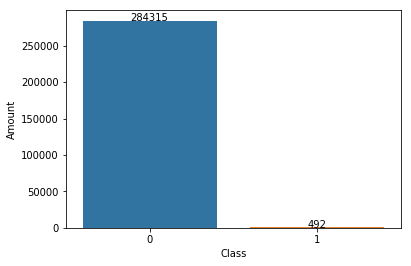

In [34]:
import numpy as np
plot_sbrn= sns.barplot(x='Class',y='Amount',data=gb_data_count)
for i,row in gb_data_count.iterrows():
    plot_sbrn.text(row.Class,row.Amount,round(row.Amount,2),color='black',ha='center')

## 3. Data between fraud or legit not balanced

## 4. Supervised learning

## Imbalanced Data

In [35]:
from sklearn.model_selection import train_test_split

In [36]:
new_df.head(5)

,V16,V14,V12,V11,V10,Class
0,-0.470401,-0.311169,-0.617801,-0.551600,0.090794,0
1,0.463917,-0.143772,1.065235,1.612727,-0.166974,0
2,-2.890083,-0.165946,0.066084,0.624501,0.207643,0
3,-1.059647,-0.287924,0.178228,-0.226487,-0.054952,0
4,-0.451449,-1.119670,0.538196,-0.822843,0.753074,0


In [37]:
X = new_df.iloc[:,1:5]
Y = new_df.iloc[:,5]
vsize = 0.20
seed = 21
X_tr,X_val,Y_tr,Y_val = train_test_split(X,Y,test_size=vsize,random_state=seed)

In [38]:
X_val

,V14,V12,V11,V10
47499,-2.715308,0.510289,0.696157,2.871005
234614,-0.094191,-1.164393,-1.876500,0.491581
128968,0.329689,1.113698,1.632146,0.016330
182186,-0.886269,-0.677828,-1.014334,0.598965
180179,-1.457198,-0.484156,-1.081322,1.723674
277517,0.423272,-0.247562,-1.571773,-1.253524
18611,0.230729,-0.746594,0.265058,0.826647
66546,-1.303267,-0.817616,-0.423237,-0.765807
54155,0.073624,0.503846,-0.544734,-0.119849
21756,-1.236069,1.141619,-1.633896,-0.520095


In [39]:
#check highest algo for predict
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier

models = []
models.append(('Logistic Regression :',LogisticRegression()))
models.append(('LinearDiscriminantAnalysis :', LinearDiscriminantAnalysis()))
models.append(('KNeighborsClassifier :', KNeighborsClassifier()))


#evaluate each model in turn
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=10, random_state=seed)
    cv_results = cross_val_score(model,X_tr, Y_tr,cv=kfold,scoring='accuracy')
    results.append(cv_results)
    names.append(name)
    msg ="%s: %f (%f)" %(name,cv_results.mean(),cv_results.std())
    print(msg)

/home/riza/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/riza/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/riza/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/riza/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
/home/riza/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22.

Logistic Regression :: 0.999140 (0.000205)
LinearDiscriminantAnalysis :: 0.999254 (0.000249)
KNeighborsClassifier :: 0.999482 (0.000196)


In [40]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [41]:
knn= KNeighborsClassifier()
knn.fit(X_tr,Y_tr)
predictions = knn.predict(X_val)
print(accuracy_score(Y_val,predictions))
print("----")
print(confusion_matrix(Y_val,predictions))
print("----")
print(classification_report(Y_val,predictions))

0.9993504441557529
----
[[56847     6]
 [   31    78]]
----
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56853
           1       0.93      0.72      0.81       109

   micro avg       1.00      1.00      1.00     56962
   macro avg       0.96      0.86      0.90     56962
weighted avg       1.00      1.00      1.00     56962



## Balanced Data (Oversampling)

In [42]:
ov_ndf = new_df.copy()

In [43]:
from sklearn.utils import resample


y1 = ov_ndf.iloc[:,1:5]
x1 = ov_ndf.iloc[:,5]


x1_train, x1_test, y1_train, y1_test = train_test_split(x1, y1, test_size=0.25, random_state=27)

In [44]:

x_con = pd.concat([x1_train, y1_train], axis=1)
x_con.head(5)

,Class,V14,V12,V11,V10
264873,0,-0.712156,-0.509490,-0.647990,-0.343885
163821,0,0.922108,0.358875,0.257633,0.443750
72083,0,0.181033,1.017046,1.263824,-0.113006
196949,0,-2.708662,-0.510443,1.016183,0.334537
126213,0,-0.072043,0.704388,0.513247,0.754427


In [46]:
not_fraud = ov_ndf[ov_ndf.Class==0]
fraud = ov_ndf[ov_ndf.Class==1]

#oversampling
fraud_over = resample(fraud,
                      replace=True, # sample with replacement
                      n_samples=len(not_fraud), # match number in majority class
                      random_state=42) # reproducible results

oversamp = pd.concat([not_fraud, fraud_over])


In [47]:
oversamp.Class.value_counts()

1    284315
0    284315
Name: Class, dtype: int64

In [48]:
new_ox = oversamp.iloc[:,1:5]
new_oy = oversamp.iloc[:,5]
vsize = 0.20
seed = 21
X_tra,X_valu,Y_tra,Y_valu = train_test_split(new_ox,new_oy,test_size=vsize,random_state=seed)

In [55]:
knn= KNeighborsClassifier()
knn.fit(X_tra,Y_tra)
predictions = knn.predict(X_valu)
print("accuracy : ",accuracy_score(Y_valu,predictions))
print("----")
print("confusion matrix : \n",confusion_matrix(Y_valu,predictions))
print("----")
print("classification_report : \n",classification_report(Y_valu,predictions))

accuracy :  0.9992350034292949
----
confusion matrix : 
 [[56503    87]
 [    0 57136]]
----
classification_report : 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56590
           1       1.00      1.00      1.00     57136

   micro avg       1.00      1.00      1.00    113726
   macro avg       1.00      1.00      1.00    113726
weighted avg       1.00      1.00      1.00    113726

